# Исследование способов определения контуров документов на фото
- Автор: Кирилл Киселев
- Дата начала: 13.04.2022
- Описание исследования: имеется 21 фото документов. Необходимо найти способы определения контуров документов на фото.

## 1. Имеющиеся изображения

## 2. Загрузка библиотек

In [1]:
# !pip install imutils==0.5.4

In [2]:
import cv2
import imutils
import numpy as np
import matplotlib as plt
import os
import math
from PIL import Image
from pyzbar import pyzbar

## 3. Глобальные переменные

In [3]:
!pwd

/home/kirillk/PycharmProjects/useful_notebooks


In [4]:
FILE_PATH = '/home/kirillk/datasets/OCR/ocr_test_cases_2/'

## 4. Необходимые функции

In [5]:
def detect_shape(contour):
    """Returns the shape (e.g. 'triangle', 'square') from the contour"""

    detected_shape = '-----'

    # Calculate perimeter of the contour:
    perimeter = cv2.arcLength(contour, True)

    # Get a contour approximation:
    contour_approx = cv2.approxPolyDP(contour, 0.03 * perimeter, True)

    # Check if the number of vertices is 3. In this case, the contour is a triangle
    if len(contour_approx) == 3:
        detected_shape = 'triangle'

    # Check if the number of vertices is 4. In this case, the contour is a square/rectangle
    elif len(contour_approx) == 4:

        # We calculate the aspect ration from the bounding rect:
        x, y, width, height = cv2.boundingRect(contour_approx)
        aspect_ratio = float(width) / height

        # A square has an aspect ratio close to 1 (comparison chaining is used):
        if 0.90 < aspect_ratio < 1.10:
            detected_shape = "square"
        else:
            detected_shape = "rectangle"

    # Check if the number of vertices is 5. In this case, the contour is a pentagon
    elif len(contour_approx) == 5:
        detected_shape = "pentagon"

    # Check if the number of vertices is 6. In this case, the contour is a hexagon
    elif len(contour_approx) == 6:
        detected_shape = "hexagon"

    # The shape as more than 6 vertices. In this example, we assume that is a circle
    else:
        detected_shape = "circle"

    # return the name of the shape and the found vertices
    return detected_shape, contour_approx

## 5. Данные

In [20]:
# список фото
photo_list = sorted([photo for photo in os.listdir(FILE_PATH) if photo.endswith('.jpg')])
photo_list

['001.jpg',
 '002.jpg',
 '003.jpg',
 '004.jpg',
 '005.jpg',
 '006.jpg',
 '007.jpg',
 '008.jpg',
 '009.jpg',
 '010.jpg',
 '011.jpg',
 '012.jpg',
 '013.jpg',
 '014.jpg',
 '015.jpg',
 '016.jpg',
 '017.jpg',
 '018.jpg',
 '019.jpg',
 '020.jpg',
 '021.jpg']

In [21]:
# посмотрим на фото

for photo in photo_list:
    image = cv2.imread(FILE_PATH + photo)
    cv2.imshow("Image", image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

## 6. Определение контуров

In [22]:
im = cv2.imread(FILE_PATH + photo_list[0])
imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(imgray, 160, 255, 0)  # 160
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

max_contour = 0
num_of_contour = None

for num, i in enumerate(contours):
    if len(i) > max_contour:
        max_contour = len(i)
        num_of_contour = num

shape, vertices = detect_shape(contours[num_of_contour])
# print(vertices)
img = cv2.polylines(im, [vertices], True, (0,0,255), 5)
# img = cv2.resize(img, (0, 0), fx=0.5, fy=0.5)

cv2.imshow("Image", img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [24]:
# посмотрим на все фото
for photo in photo_list:
    im = cv2.imread(FILE_PATH + photo)
    imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(imgray, 160, 255, 0)  # 160
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    max_contour = 0
    num_of_contour = None

    for num, i in enumerate(contours):
        if len(i) > max_contour:
            max_contour = len(i)
            num_of_contour = num

    shape, vertices = detect_shape(contours[num_of_contour])
    # print(vertices)
    img = cv2.polylines(im, [vertices], True, (0,0,255), 3)
    # img = cv2.resize(img, (0, 0), fx=0.5, fy=0.5)

    cv2.imshow("Image", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

### Вывод
Как видно изрезультатов работы скрипта - определить контуры документа на фото очень непросто.

На это влияет несколько факторов:
1. Фон, на котором сделано фото
2. Артефакты (руки)
3. Дополнительные объекты на фото. 

## 7. Определение контуров на качественных фото

Теперь поработаем с качественными фотографиями двух типов:

1. Качество съемки удовлетворительное
2. Качество съемки близко к идаельному в плане освещения и фона

In [25]:
FILE_PATH_2 = '/home/kirillk/datasets/OCR/ocr_test_cases_3/'

In [26]:
good_photo_list = sorted(os.listdir(FILE_PATH_2))
good_photo_list

['001.JPG',
 '002.JPG',
 '003.JPG',
 '004.JPG',
 '005.JPG',
 '006.JPG',
 '007.JPG',
 '008.JPG',
 '009.JPG',
 '010.JPG',
 '011.JPG',
 '012.JPG']

In [52]:
# посмотрим на фото
for photo in good_photo_list:
    image = cv2.imread(FILE_PATH_2 + photo)
    image = cv2.resize(image, (0, 0), fx=0.2, fy=0.2)
    cv2.imshow("Image", image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [29]:
# посмотрим на фото с контурами
for photo in good_photo_list:
    im = cv2.imread(FILE_PATH_2 + photo)
    imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(imgray, 160, 255, 0)  # 160
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    max_contour = 0
    num_of_contour = None

    for num, i in enumerate(contours):
        if len(i) > max_contour:
            max_contour = len(i)
            num_of_contour = num

    shape, vertices = detect_shape(contours[num_of_contour])
    # print(vertices)
    img = cv2.polylines(im, [vertices], True, (0, 0, 255), 8)
    img = cv2.resize(img, (0, 0), fx=0.23, fy=0.23)

    cv2.imshow("Image", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

### Вывод
Определение контуров документа на качественном фото также зависит от фона и освещения.

## 8. Поворот фото

Для исследования возможностей поворота фотографий выделим из перечня фотографии со значтельным поворотом.

In [7]:
rotated_photo_list = ['009.JPG', '010.JPG', '011.JPG', '012.JPG']

In [56]:
# посмотрим на фото
for photo in rotated_photo_list:
    image = cv2.imread(FILE_PATH_2 + photo)
    image = cv2.resize(image, (0, 0), fx=0.2, fy=0.2)
    cv2.imshow("Image", image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [55]:
# посмотрим на фото с контурами
for photo in rotated_photo_list:
    im = cv2.imread(FILE_PATH_2 + photo)
    imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(imgray, 160, 255, 0)  # 160
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    max_contour = 0
    num_of_contour = None

    for num, i in enumerate(contours):
        if len(i) > max_contour:
            max_contour = len(i)
            num_of_contour = num

    shape, vertices = detect_shape(contours[num_of_contour])
    # print(vertices)
    img = cv2.polylines(im, [vertices], True, (0, 0, 255), 8)
    img = cv2.resize(img, (0, 0), fx=0.23, fy=0.23)

    cv2.imshow("Image", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

#### Вывод
Контуры на всех фото выделяются качественно. 

### Для примера обработаем первое фото из списка.

In [10]:
im = cv2.imread(FILE_PATH_2 + rotated_photo_list[0])
imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(imgray, 160, 255, 0)  # 160
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

max_contour = 0
num_of_contour = None

for num, i in enumerate(contours):
    if len(i) > max_contour:
        max_contour = len(i)
        num_of_contour = num

shape, vertices = detect_shape(contours[num_of_contour])
print(shape, vertices)
img = cv2.polylines(im, [vertices], True, (0, 0, 255), 8)
img = cv2.resize(img, (0, 0), fx=0.23, fy=0.23)

cv2.imshow("Image", img)
cv2.waitKey(0)
cv2.destroyAllWindows()

rectangle [[[ 843  297]]

 [[ 203 3192]]

 [[2312 3640]]

 [[2826  736]]]


In [10]:
x1 = (vertices[1][0][0])
y1 = (vertices[1][0][1])

x2 = (vertices[2][0][0])
y2 = (vertices[2][0][1])

xM = (vertices[1][0][0])
yM = (vertices[2][0][1])

print(x1, y2, x2, y2, xM, yM)

203 3640 2312 3640 203 3640


In [11]:
catet_1_M = abs(x2 - xM)
catet_M_2 = abs(yM - y1)

print(catet_1_M)
print(catet_M_2)

2109
448


In [12]:
tg_a = catet_M_2 / catet_1_M
angle = round(math.degrees(math.atan(tg_a)))
angle

12

In [19]:
test_img = cv2.imread(FILE_PATH_2 + rotated_photo_list[0])
test_img = cv2.resize(test_img, (0, 0), fx=0.23, fy=0.23)
rotated = imutils.rotate_bound(test_img, -angle)
cv2.imshow(f"Rotated by {angle} Degrees", rotated)
cv2.waitKey(0)
cv2.destroyAllWindows()

### Тест автоматизации поворота и кропа первого фото из списка.

In [38]:
im = cv2.imread(FILE_PATH_2 + rotated_photo_list[3])
im_gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
_, thresh = cv2.threshold(im_gray, 160, 255, 0)  # 160
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

max_contour = 0
num_of_contour = None

for num, i in enumerate(contours):
    if len(i) > max_contour:
        max_contour = len(i)
        num_of_contour = num

shape, vertices = detect_shape(contours[num_of_contour])

x1 = (vertices[1][0][0])
y1 = (vertices[1][0][1])

x2 = (vertices[2][0][0])
y2 = (vertices[2][0][1])

xM = (vertices[1][0][0])
yM = (vertices[2][0][1])

catet_M_2 = abs(x2 - xM)
catet_1_M = abs(yM - y1)

tg_a = catet_1_M / catet_M_2
angle = round(math.degrees(math.atan(tg_a)))

# здесь осуществили поворот, rotate_bound поворачивает изображение по часовой стрелке
img = imutils.rotate_bound(im_gray, -angle)

# снова ищем контуры документа
_, thresh = cv2.threshold(img, 160, 255, 0)  
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

max_contour = 0
num_of_contour = None

for num, i in enumerate(contours):
    if len(i) > max_contour:
        max_contour = len(i)
        num_of_contour = num

_, vertices_2 = detect_shape(contours[num_of_contour])

x_1, x_2 = min([vertices_2[0][0][0], vertices_2[1][0][0]]), max([vertices_2[2][0][0], vertices_2[3][0][0]])
y_1, y_2 = min([vertices_2[0][0][1], vertices_2[3][0][1]]), max([vertices_2[2][0][1], vertices_2[2][0][1]])
print(x_1, x_2)
print(y_1, y_2)

# img = cv2.polylines(img, [vertices_2], True, (0, 0, 255), 8)
# print(vertices_2)

im = imutils.rotate_bound(im, -angle)

im = im[y_1:y_2, x_1:x_2]

im = cv2.resize(im, (0, 0), fx=0.3, fy=0.3)


# img = img[y_1:y_2, x_1:x_2]
# img = cv2.resize(img, (0, 0), fx=0.23, fy=0.23)

cv2.imshow("Image", im)
cv2.waitKey(0)
cv2.destroyAllWindows()

737 3675
833 2954


### Оптимизация скрипта поворота фото 

In [31]:
def find_contour(gray_image, threshold=160):
    _, thresh = cv2.threshold(gray_image, threshold, 255, 0)  # 160
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    max_contour = 0
    num_of_contour = None

    for num, i in enumerate(contours):
        if len(i) > max_contour:
            max_contour = len(i)
            num_of_contour = num
    return contours[num_of_contour]    

In [59]:
%%time
im = cv2.imread(FILE_PATH_2 + rotated_photo_list[0])
im_gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

doc_contour = find_contour(im_gray)
shape, vertices = detect_shape(doc_contour)

assert shape=='rectangle'

x1, y1 = vertices[1][0][0], vertices[1][0][1]
x2, y2 = vertices[2][0][0], vertices[2][0][1]
xM, yM = vertices[1][0][0], vertices[2][0][1]

# catet_M_2 = abs(x2 - xM)
# catet_1_M = abs(yM - y1)

catet_M_2 = (x2 - xM)
catet_1_M = (yM - y1)

tg_a = catet_1_M / catet_M_2
angle = round(math.degrees(math.atan(tg_a)))

# здесь осуществили поворот, rotate_bound поворачивает изображение по часовой стрелке
img = imutils.rotate_bound(im_gray, -angle)

# снова ищем контуры документа
contour_for_crop = find_contour(img)
_, vertices_2 = detect_shape(contour_for_crop)

x_1, x_2 = min([vertices_2[0][0][0], vertices_2[1][0][0]]), max([vertices_2[2][0][0], vertices_2[3][0][0]])
y_1, y_2 = min([vertices_2[0][0][1], vertices_2[3][0][1]]), max([vertices_2[2][0][1], vertices_2[2][0][1]])

im = imutils.rotate_bound(im, -angle)
im = im[y_1:y_2, x_1:x_2]
im = cv2.resize(im, (0, 0), fx=0.3, fy=0.3)

cv2.imshow("Image", im)
cv2.waitKey(0)
cv2.destroyAllWindows()

CPU times: user 1.43 s, sys: 1.03 s, total: 2.46 s
Wall time: 992 ms


### Обобщение на первые два фото из списка

In [19]:
im = cv2.imread(FILE_PATH_2 + rotated_photo_list[3])
im_gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
_, thresh = cv2.threshold(im_gray, 160, 255, 0)  # 160
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

max_contour = 0
num_of_contour = None

for num, i in enumerate(contours):
    if len(i) > max_contour:
        max_contour = len(i)
        num_of_contour = num

shape, vertices = detect_shape(contours[num_of_contour])

x1 = (vertices[1][0][0])
y1 = (vertices[1][0][1])

x2 = (vertices[2][0][0])
y2 = (vertices[2][0][1])

xM = (vertices[1][0][0])
yM = (vertices[2][0][1])

catet_M_2 = abs(x2 - xM)
catet_1_M = abs(yM - y1)

if True:
    pass

tg_a = catet_1_M / catet_M_2
angle = -round(math.degrees(math.atan(tg_a)))

if catet_1_M >= catet_M_2:
    angle = 90+angle
    
# здесь осуществили поворот, rotate_bound поворачивает изображение по часовой стрелке
img = imutils.rotate_bound(im_gray, angle)

# снова ищем контуры документа
_, thresh = cv2.threshold(img, 160, 255, 0)  
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

max_contour = 0
num_of_contour = None

for num, i in enumerate(contours):
    if len(i) > max_contour:
        max_contour = len(i)
        num_of_contour = num

_, vertices_2 = detect_shape(contours[num_of_contour])

x_1, x_2 = min([vertices_2[0][0][0], vertices_2[1][0][0]]), max([vertices_2[2][0][0], vertices_2[3][0][0]])
y_1, y_2 = min([vertices_2[0][0][1], vertices_2[3][0][1]]), max([vertices_2[2][0][1], vertices_2[2][0][1]])
print(x_1, x_2)
print(y_1, y_2)

# img = cv2.polylines(img, [vertices_2], True, (0, 0, 255), 8)
# print(vertices_2)

im = imutils.rotate_bound(im, angle)

im = im[y_1:y_2, x_1:x_2]

im = cv2.resize(im, (0, 0), fx=0.3, fy=0.3)


# img = img[y_1:y_2, x_1:x_2]
# img = cv2.resize(img, (0, 0), fx=0.23, fy=0.23)

cv2.imshow("Image", im)
cv2.waitKey(0)
cv2.destroyAllWindows()

896 3020
737 3676


### Контуры на всех фото выделяются качественно. Для примера обработаем второе фото из списка.

In [21]:
im = cv2.imread(FILE_PATH_2 + rotated_photo_list[1])
imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(imgray, 160, 255, 0)  # 160
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

max_contour = 0
num_of_contour = None

for num, i in enumerate(contours):
    if len(i) > max_contour:
        max_contour = len(i)
        num_of_contour = num

shape, vertices = detect_shape(contours[num_of_contour])
print(shape, vertices)
img = cv2.polylines(im, [vertices], True, (0, 0, 255), 8)
img = cv2.resize(img, (0, 0), fx=0.23, fy=0.23)

cv2.imshow("Image", img)
cv2.waitKey(0)
cv2.destroyAllWindows()

rectangle [[[2153  379]]

 [[ 220  773]]

 [[ 820 3597]]

 [[2825 3121]]]


In [22]:
x1 = (vertices[1][0][0])
y1 = (vertices[1][0][1])

x2 = (vertices[2][0][0])
y2 = (vertices[2][0][1])

xM = (vertices[1][0][0])
yM = (vertices[2][0][1])

print(x1, y2, x2, y2, xM, yM)

220 3597 820 3597 220 3597


In [23]:
catet_1_M = abs(x2 - xM)
catet_M_2 = abs(yM - y1)

print(catet_1_M)
print(catet_M_2)

600
2824


In [24]:
tg_a = catet_M_2 / catet_1_M
angle = round(math.degrees(math.atan(tg_a)))
angle

78

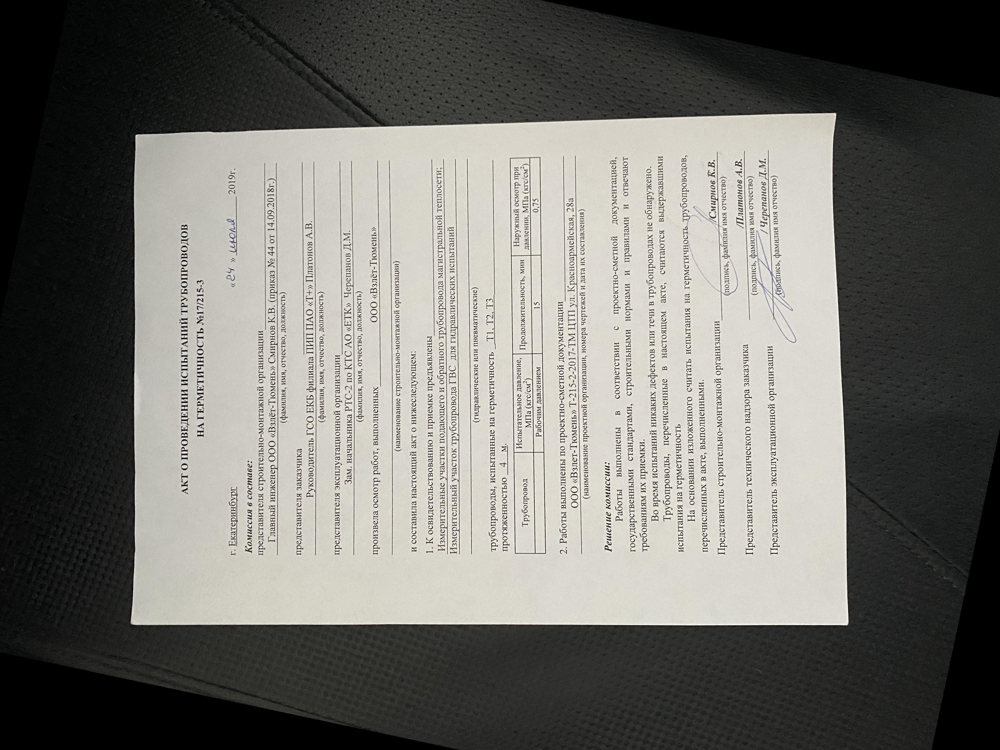

In [29]:
img = Image.open(FILE_PATH_2 + rotated_photo_list[1]) 
 
rotate_img= img.rotate(angle-90)
rotate_img
# img

### Определение контуров

In [13]:
for i in range(130, 160):
    im = cv2.imread(FILE_PATH + '012.jpg')
    imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(imgray, i, 255, 0)
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    img = cv2.drawContours(im, contours, -1, (0,255,0), 2)

    cv2.imshow(f"Image, {i}", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [14]:
im = cv2.imread(FILE_PATH + '012.jpg')
imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(imgray, 160, 255, 0)
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
img = cv2.drawContours(im, contours, -1, (0,255,0), 2)
type(contours)

max_contour = 0
num_of_contour = None

for num, i in enumerate(contours):
    if len(i) > max_contour:
        max_contour = len(i)
        num_of_contour = num

print(max_contour)
print(num_of_contour)
# print(f'contours lenght: {len(contours)}')

# cv2.imshow("Image", img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

7144
974


In [15]:
im = cv2.imread(FILE_PATH + '012.jpg')
imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(imgray, 160, 255, 0)
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
# M = cv2.moments(contours[974])

# cX = int(M['m10'] / M['m00'])
# cY = int(M['m01'] / M['m00'])
# print(cX, cY)
shape, vertices = detect_shape(contours[974])
# print(vertices)
img = cv2.rectangle(im, vertices[0][0], vertices[2][0], (0,255,0),3)
# img = draw_contour_points(im, [vertices], (255, 255, 255))

# img = cv2.drawContours(im, contours[974], -1, (0,255,0), 2)

cv2.imshow("Image", img)
cv2.waitKey(0)
cv2.destroyAllWindows()

### Current point of research

In [16]:
im = cv2.imread(FILE_PATH + '012.jpg')
imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(imgray, 160, 255, 0)
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

max_contour = 0
num_of_contour = None

for num, i in enumerate(contours):
    if len(i) > max_contour:
        max_contour = len(i)
        num_of_contour = num

shape, vertices = detect_shape(contours[num_of_contour])
img = cv2.rectangle(im, vertices[0][0], vertices[2][0], (0,255,0),3)


cv2.imshow("Image", img)
cv2.waitKey(0)
cv2.destroyAllWindows()

### Current point of research

In [17]:
for photo in photo_list:
    im = cv2.imread(FILE_PATH + photo)
    imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(imgray, 160, 255, 0)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    max_contour = 0
    num_of_contour = None

    for num, i in enumerate(contours):
        if len(i) > max_contour:
            max_contour = len(i)
            num_of_contour = num

    shape, vertices = detect_shape(contours[num_of_contour])
    img = cv2.rectangle(im, vertices[0][0], vertices[2][0], (0,255,0),3)


    cv2.imshow("Image", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [18]:
FILE_PATH_1 = '/home/kirillk/datasets/OCR/ocr_test_cases_3/'

In [19]:
test_photos = os.listdir(FILE_PATH_1)

In [20]:
# посмотрим на фото

for photo in test_photos:
    image = cv2.imread(FILE_PATH_1 + photo)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image = cv2.resize(image, (0, 0), fx=0.25, fy=0.25)
    cv2.imshow("Image", image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [21]:
for i in range(150, 250, 10):
    im = cv2.imread(FILE_PATH_1 + '007.JPG')
    imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(imgray, i, 255, 0)
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    img = cv2.drawContours(im, contours, -1, (0,255,0), 2)
    img = cv2.resize(img, (0, 0), fx=0.23, fy=0.23)


    cv2.imshow(f"Image, {i}", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [22]:
im = cv2.imread(FILE_PATH_1 + '008.JPG')
imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(imgray, 160, 255, 0)  # 160
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

max_contour = 0
num_of_contour = None

for num, i in enumerate(contours):
    if len(i) > max_contour:
        max_contour = len(i)
        num_of_contour = num

shape, vertices = detect_shape(contours[num_of_contour])
# img = cv2.rectangle(im, vertices[0][0], vertices[2][0], (0,255,0),5)
img = draw_contour_points(im, [vertices], (255, 255, 255))
img = cv2.resize(img, (0, 0), fx=0.23, fy=0.23)

cv2.imshow("Image", img)
cv2.waitKey(0)
cv2.destroyAllWindows()

[[[2929   55]]

 [[  68   94]]

 [[ 276 3906]]

 [[2869 3928]]]


NameError: name 'cv' is not defined

In [70]:
for photo in test_photos:
    im = cv2.imread(FILE_PATH_1 + photo)
    imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(imgray, 160, 255, 0)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    max_contour = 0
    num_of_contour = None

    for num, i in enumerate(contours):
        if len(i) > max_contour:
            max_contour = len(i)
            num_of_contour = num

    shape, vertices = detect_shape(contours[num_of_contour])
#     img = cv2.rectangle(im, vertices[0][0], vertices[2][0], (0,255,0),3)
    img = draw_contour_points(im, [vertices], (255, 255, 255))

    img = cv2.resize(img, (0, 0), fx=0.3, fy=0.3)

    cv2.imshow("Image", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

(2, 1, 2)
(2, 2)
(4, 1, 2)
(4, 2)
(2, 1, 2)
(2, 2)
(4, 1, 2)
(4, 2)
(4, 1, 2)
(4, 2)
(4, 1, 2)
(4, 2)
(1, 1, 2)
(2,)


error: OpenCV(4.5.5) :-1: error: (-5:Bad argument) in function 'circle'
> Overload resolution failed:
>  - Can't parse 'center'. Expected sequence length 2, got 1
>  - Can't parse 'center'. Expected sequence length 2, got 1


## Выделение контуров, поворот и кроп

In [50]:
im = cv2.imread(FILE_PATH_1 + '008.JPG')
imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(imgray, 160, 255, 0)  # 160
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

max_contour = 0
num_of_contour = None

for num, i in enumerate(contours):
    if len(i) > max_contour:
        max_contour = len(i)
        num_of_contour = num

shape, vertices = detect_shape(contours[num_of_contour])
print(vertices)
# img = cv2.rectangle(im, vertices[0][0], vertices[2][0], (0,255,0),5)
# img = draw_contour_points(im, [vertices], (255, 255, 255))
img = cv2.polylines(im, [vertices], True, (0,0,255), 5)
# img = im[0:image.shape[0], 0:int(image.shape[1]*0.25)]
img = cv2.resize(img, (0, 0), fx=0.23, fy=0.23)

cv2.imshow("Image", img)
cv2.waitKey(0)
cv2.destroyAllWindows()

[[[2929   55]]

 [[  68   94]]

 [[ 276 3906]]

 [[2869 3928]]]


In [45]:
x2 = (vertices[2][0][0])
y2 = (vertices[2][0][1])
x3 = (vertices[3][0][0])
y3 = (vertices[3][0][1])

y3

3928

In [46]:
catet_x = abs(x2 - x3)
catet_y = abs(y2 - y3)

In [49]:
tg_a = catet_y / catet_x
angle = round(math.degrees(math.atan(tg_a)))
angle

0

In [54]:
img = Image.open(FILE_PATH_1 + '008.JPG') 
 
rotate_img= img.rotate(22.0).crop((0, 0, 1200, 400))
# rotate_img

In [ ]:
image = cv2.imread(FILE_PATH + '012.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
image = cv2.GaussianBlur(image, (3, 3), 0)
T, thresh_img = cv2.threshold(image, 130, 255, cv2.THRESH_BINARY)

cv2.imshow("Image", thresh_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [27]:
image = cv2.imread(FILE_PATH + '012.jpg')
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cnts = find_contours(gray_image)
cv2.imshow("Image", image, cnts)
cv2.waitKey(0)
cv2.destroyAllWindows()

error: OpenCV(4.5.5) :-1: error: (-5:Bad argument) in function 'imshow'
> Overload resolution failed:
>  - imshow() takes at most 2 arguments (3 given)
>  - imshow() takes at most 2 arguments (3 given)
>  - imshow() takes at most 2 arguments (3 given)


In [69]:
# find_contours(gray_image)


In [10]:
# посмотрим на фото
for photo in photo_list:
    image = cv2.imread(FILE_PATH + photo)
    perimeter = cv2.arcLength(image, True)
    print(perimeter)
#     cv2.imshow("Image", image)
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()

error: OpenCV(4.5.5) /io/opencv/modules/imgproc/src/shapedescr.cpp:280: error: (-215:Assertion failed) count >= 0 && (depth == CV_32F || depth == CV_32S) in function 'arcLength'


In [ ]:
"""
Contours shape recognition mainly based on cv2.approxPolyDP() function
"""


def get_position_to_draw(text, point, font_face, font_scale, thickness):
    """Gives the coordinates to draw centered"""

    text_size = cv2.getTextSize(text, font_face, font_scale, thickness)[0]
    text_x = point[0] - text_size[0] / 2
    text_y = point[1] + text_size[1] / 2
    return round(text_x), round(text_y)


def detect_shape(contour):
    """Returns the shape (e.g. 'triangle', 'square') from the contour"""

    detected_shape = '-----'

    # Calculate perimeter of the contour:
    perimeter = cv2.arcLength(contour, True)

    # Get a contour approximation:
    contour_approx = cv2.approxPolyDP(contour, 0.03 * perimeter, True)

    # Check if the number of vertices is 3. In this case, the contour is a triangle
    if len(contour_approx) == 3:
        detected_shape = 'triangle'

    # Check if the number of vertices is 4. In this case, the contour is a square/rectangle
    elif len(contour_approx) == 4:

        # We calculate the aspect ration from the bounding rect:
        x, y, width, height = cv2.boundingRect(contour_approx)
        aspect_ratio = float(width) / height

        # A square has an aspect ratio close to 1 (comparison chaining is used):
        if 0.90 < aspect_ratio < 1.10:
            detected_shape = "square"
        else:
            detected_shape = "rectangle"

    # Check if the number of vertices is 5. In this case, the contour is a pentagon
    elif len(contour_approx) == 5:
        detected_shape = "pentagon"

    # Check if the number of vertices is 6. In this case, the contour is a hexagon
    elif len(contour_approx) == 6:
        detected_shape = "hexagon"

    # The shape as more than 6 vertices. In this example, we assume that is a circle
    else:
        detected_shape = "circle"

    # return the name of the shape and the found vertices
    return detected_shape, contour_approx


def array_to_tuple(arr):
    """Converts array to tuple"""

    return tuple(arr.reshape(1, -1)[0])


def draw_contour_points(img, cnts, color):
    """Draw all points from a list of contours"""

    for cnt in cnts:
        print(cnt.shape)
        squeeze = np.squeeze(cnt)
        print(squeeze.shape)

        for p in squeeze:
            pp = array_to_tuple(p)
            cv2.circle(img, pp, 10, color, -1)

    return img


def draw_contour_outline(img, cnts, color, thickness=1):
    """Draws contours outlines of each contour"""

    for cnt in cnts:
        cv2.drawContours(img, [cnt], 0, color, thickness)


def show_img_with_matplotlib(color_img, title, pos):
    """Shows an image using matplotlib capabilities"""

    # Convert BGR image to RGB
    img_RGB = color_img[:, :, ::-1]

    ax = plt.subplot(2, 2, pos)
    plt.imshow(img_RGB)
    plt.title(title)
    plt.axis('off')


# Create the dimensions of the figure and set title:
fig = plt.figure(figsize=(12, 9))
plt.suptitle("Shape recognition based on cv2.approxPolyDP()", fontsize=14, fontweight='bold')
fig.patch.set_facecolor('silver')

# Load the image and convert it to grayscale:
# image = build_sample_image_2()
image = cv2.imread("shapes.png")
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply cv2.threshold() to get a binary image:
ret, thresh = cv2.threshold(gray_image, 50, 255, cv2.THRESH_BINARY)

# Find contours using the thresholded image:
# Note: cv2.findContours() has been changed to return only the contours and the hierarchy
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

# Show the number of detected contours:
print("detected contours: '{}' ".format(len(contours)))

# Make a copy to draw the results:
image_contours = image.copy()
image_recognition_shapes = image.copy()

# Draw the outline of all detected contours:
draw_contour_outline(image_contours, contours, (255, 255, 255), 4)

for contour in contours:
    # Compute the moments of the current contour:
    M = cv2.moments(contour)

    # Calculate the centroid of the contour from the moments:
    cX = int(M['m10'] / M['m00'])
    cY = int(M['m01'] / M['m00'])

    # Detect shape of the current contour:
    shape, vertices = detect_shape(contour)

    # Draw the detected vertices:
    draw_contour_points(image_contours, [vertices], (255, 255, 255))

    # Get the position to draw:
    (x, y) = get_position_to_draw(shape, (cX, cY), cv2.FONT_HERSHEY_SIMPLEX, 1.6, 3)

    # Write the name of shape on the center of shapes
    cv2.putText(image_recognition_shapes, shape, (x, y), cv2.FONT_HERSHEY_SIMPLEX, 1.6, (255, 255, 255), 3)

# Plot the images
show_img_with_matplotlib(image, "image", 1)
show_img_with_matplotlib(cv2.cvtColor(thresh, cv2.COLOR_GRAY2BGR), "threshold = 100", 2)
show_img_with_matplotlib(image_contours, "contours outline (after approximation)", 3)
show_img_with_matplotlib(image_recognition_shapes, "contours recognition", 4)

# Show the Figure:
plt.show()

### Необходимые функции

In [15]:
def draw_barcode(decoded, image):
    image = cv2.rectangle(image, (decoded.rect.left, decoded.rect.top),
                          (decoded.rect.left + decoded.rect.width, decoded.rect.top + decoded.rect.height),
                          color=(0, 255, 0),
                          thickness=5)
    return image

In [16]:
def decode(image):
    # decodes all barcodes from an image
    decoded_objects = pyzbar.decode(image)
    
    for obj in decoded_objects:
        # draw the barcode
        print(f"Обнаружен штрих-код:\n{obj}")
        image = draw_barcode(obj, image)
        # print barcode type & data
        # print("Тип:", obj.type)
        print("Данные:", obj.data)
        print()

    return len(decoded_objects), image

### Применение Гауссовского блюра на нераспознанные документы

In [14]:
# исходный список нараспознанных документов
bad_barcodes_list = ['038.jpg', '039.jpg', '040.jpg',
                     '041.jpg', '042.jpg', '043.jpg',
                     '044.jpg', '095.jpg', '146.jpg',
                     '157.jpg', '159.jpg']

In [17]:
# список документов с нераспознанным штрих-кодом
bad_barcodes_list_1 = []

In [18]:
for file in bad_barcodes_list:
    print(f'----------------{file}----------------')
    image = cv2.imread(FILE_PATH + file)
    image = cv2.GaussianBlur(image, (7, 7), 0)
    
    bar_code_qty, img = decode(image)
    if bar_code_qty == 0:
        bad_barcodes_list_1.append(file)
    

----------------038.jpg----------------
Обнаружен штрих-код:
Decoded(data=b'2860350693578', type='EAN13', rect=Rect(left=336, top=236, width=683, height=96), polygon=[Point(x=336, y=237), Point(x=336, y=295), Point(x=337, y=327), Point(x=688, y=332), Point(x=1019, y=322), Point(x=1019, y=242), Point(x=687, y=236)], quality=121, orientation='UP')
Данные: b'2860350693578'

----------------039.jpg----------------
Обнаружен штрих-код:
Decoded(data=b'2860350669320', type='EAN13', rect=Rect(left=341, top=231, width=681, height=94), polygon=[Point(x=341, y=235), Point(x=341, y=325), Point(x=693, y=324), Point(x=1022, y=322), Point(x=1022, y=264), Point(x=1021, y=242), Point(x=671, y=231)], quality=122, orientation='UP')
Данные: b'2860350669320'

----------------040.jpg----------------
Обнаружен штрих-код:
Decoded(data=b'2810095177772', type='EAN13', rect=Rect(left=329, top=243, width=690, height=91), polygon=[Point(x=329, y=243), Point(x=329, y=333), Point(x=686, y=334), Point(x=1019, y=324),

In [19]:
bad_barcodes_list_1

['095.jpg', '146.jpg', '157.jpg', '159.jpg']

### Вывод
<br>Гауссовский блюр позволил распознать 7 изображений из 11.

### Не распознанные изображения после Гауссовского блюра

- 095.jpg - непонятно, почему не распознано
- 146.jpg - шум
- 157.jpg - блюр
- 159.jpg - блюр

### Случай с "непонятным" изображением 095.jpg

In [10]:
image = cv2.imread(FILE_PATH + bad_barcodes_list_1[0])
image = image[0:image.shape[0], 0:int(image.shape[1]*0.25)]
image = cv2.blur(image,(7, 7), 0)
barcode_list, img = decode(image)

Обнаружен штрих-код:
Decoded(data=b'2860591580422', type='EAN13', rect=Rect(left=413, top=348, width=662, height=66), polygon=[Point(x=413, y=377), Point(x=728, y=413), Point(x=1075, y=414), Point(x=1075, y=370), Point(x=1074, y=348), Point(x=749, y=348), Point(x=728, y=349)], quality=69, orientation='UP')
Данные: b'2860591580422'



### Вывод
<br>Замена Гауссовского блюра на простой блюр позволило распознать изображение 095.jpg.

### Случай с зашумленным изображением 146.jpg

In [20]:
image = cv2.imread(FILE_PATH + bad_barcodes_list_1[1])
image = image[0:image.shape[0], 0:int(image.shape[1]*0.25)]
image = cv2.GaussianBlur(image, (7, 7), 0)
# image = cv2.blur(image, (5, 5), 0)
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
_, image = cv2.threshold(image, 130, 255, cv2.THRESH_BINARY)

_, img = decode(image)

# cv2.imshow("Image", img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

Обнаружен штрих-код:
Decoded(data=b'2860601473409', type='EAN13', rect=Rect(left=307, top=285, width=675, height=56), polygon=[Point(x=307, y=287), Point(x=307, y=291), Point(x=309, y=341), Point(x=634, y=341), Point(x=980, y=340), Point(x=982, y=308), Point(x=982, y=306), Point(x=980, y=286), Point(x=634, y=285)], quality=64, orientation='UP')
Данные: b'2860601473409'



### Вывод
<br>Зашумленное изображение можно распознать применив либо `blur` либо `Gaussian` затем<br>
`image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
_, image = cv2.threshold(image, 130, 255, cv2.THRESH_BINARY)`

### Случай с размытым изображением 157.jpg

In [21]:
threshold_list_157 = []

In [22]:
%%time

for i in range (180, 200):
    image = cv2.imread(FILE_PATH + bad_barcodes_list_1[2])
    image = cv2.GaussianBlur(image, (1, 1), 0)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, image = cv2.threshold(image, i, 255, cv2.THRESH_BINARY)
    
    barcode_qty, img = decode(image)
    if barcode_qty > 0:
        threshold_list_157.append(i)

Обнаружен штрих-код:
Decoded(data=b'2860610590685', type='EAN13', rect=Rect(left=252, top=177, width=676, height=20), polygon=[Point(x=252, y=181), Point(x=581, y=197), Point(x=928, y=196), Point(x=928, y=180), Point(x=583, y=177)], quality=14, orientation='UP')
Данные: b'2860610590685'

Обнаружен штрих-код:
Decoded(data=b'2860610590685', type='EAN13', rect=Rect(left=251, top=174, width=677, height=46), polygon=[Point(x=251, y=181), Point(x=928, y=220), Point(x=928, y=174), Point(x=252, y=175)], quality=21, orientation='UP')
Данные: b'2860610590685'

Обнаружен штрих-код:
Decoded(data=b'2860610590685', type='EAN13', rect=Rect(left=251, top=175, width=678, height=44), polygon=[Point(x=251, y=179), Point(x=251, y=181), Point(x=580, y=219), Point(x=928, y=198), Point(x=929, y=182), Point(x=928, y=178), Point(x=581, y=175), Point(x=252, y=175)], quality=26, orientation='UP')
Данные: b'2860610590685'

Обнаружен штрих-код:
Decoded(data=b'2860610590685', type='EAN13', rect=Rect(left=251, top=1

In [23]:
threshold_list_157

[189, 190, 191, 192, 193, 194, 195, 196, 197]

In [31]:
image = cv2.imread(FILE_PATH + bad_barcodes_list_1[2])
image = cv2.GaussianBlur(image, (1, 1), 0)
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
_, image = cv2.threshold(image, threshold_list_157[-1], 255, cv2.THRESH_BINARY)
    
_, img = decode(image)

# cv2.imshow("Image", img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

Обнаружен штрих-код:
Decoded(data=b'2860610590685', type='EAN13', rect=Rect(left=251, top=181, width=678, height=38), polygon=[Point(x=251, y=181), Point(x=579, y=219), Point(x=929, y=218), Point(x=929, y=182)], quality=10, orientation='UP')
Данные: b'2860610590685'



### Случай с размытым изображением 159.jpg

In [32]:
threshold_list_159 = []

In [33]:
%%time

for i in range (180, 200):
    image = cv2.imread(FILE_PATH + bad_barcodes_list_1[3])
    image = cv2.GaussianBlur(image, (1, 1), 0)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, image = cv2.threshold(image, i, 255, cv2.THRESH_BINARY)
    
    barcode_qty, img = decode(image)
    if barcode_qty > 0:
        threshold_list_159.append(i)

Обнаружен штрих-код:
Decoded(data=b'2860610411164', type='EAN13', rect=Rect(left=231, top=141, width=655, height=7), polygon=[Point(x=231, y=141), Point(x=231, y=145), Point(x=233, y=147), Point(x=886, y=148), Point(x=886, y=142)], quality=8, orientation='UP')
Данные: b'2860610411164'

Обнаружен штрих-код:
Decoded(data=b'2860610411164', type='EAN13', rect=Rect(left=231, top=146, width=655, height=4), polygon=[Point(x=231, y=147), Point(x=233, y=149), Point(x=569, y=150), Point(x=886, y=148), Point(x=886, y=146), Point(x=568, y=146)], quality=9, orientation='UP')
Данные: b'2860610411164'

Обнаружен штрих-код:
Decoded(data=b'2860610411164', type='EAN13', rect=Rect(left=230, top=143, width=656, height=7), polygon=[Point(x=230, y=143), Point(x=231, y=149), Point(x=569, y=150), Point(x=886, y=148)], quality=7, orientation='UP')
Данные: b'2860610411164'

Обнаружен штрих-код:
Decoded(data=b'2860610411164', type='EAN13', rect=Rect(left=230, top=142, width=656, height=8), polygon=[Point(x=230, 

In [34]:
threshold_list_159

[187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199]

In [35]:
image = cv2.imread(FILE_PATH + bad_barcodes_list_1[3])
image = cv2.GaussianBlur(image, (1, 1), 0)
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
_, image = cv2.threshold(image, threshold_list_159[-3], 255, cv2.THRESH_BINARY)
    
_, img = decode(image)

# cv2.imshow("Image", img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

Обнаружен штрих-код:
Decoded(data=b'2860610411164', type='EAN13', rect=Rect(left=229, top=117, width=658, height=31), polygon=[Point(x=229, y=131), Point(x=229, y=137), Point(x=230, y=147), Point(x=570, y=148), Point(x=887, y=142), Point(x=887, y=118), Point(x=230, y=117)], quality=29, orientation='UP')
Данные: b'2860610411164'



In [41]:
# пересечени списка настроек порога
sorted(list(set(threshold_list_157) & set(threshold_list_159)))

[189, 190, 191, 192, 193, 194, 195, 196, 197]

### Вывод
<br>Сильно-размытое изображение можно распознать применив либо `Gaussian` с матрицей (1, 1)затем<br>
`image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
_, image = cv2.threshold(image, n, 255, cv2.THRESH_BINARY)`<br>
где **n** лежит в диапазоне [189, 190, 191, 192, 193, 194, 195, 196, 197] мы применили n=197

## Выводы

1. Для обработки изображений перед детекцией и распознаванием штрих-кода стоит применить трансформацию Гауссовского блюра с матрицей 7х7 `image = cv2.GaussianBlur(image, (7, 7), 0)` судя по тестовым данным такое преобразование примененное к каждому изображению повышает точность детекции штрих-кода до **98%**.
2. После применения Гауссовского блюра (п.1) прототип распознал 201 изображение из 205. В этом исследовании были подобраны преобразования для оставшихся 4 изображений - 095.jpg, 146.jpg, 157.jpg, 159.jpg.
3. Изображение 095.jpg - качественное изображение, странно, что тетектор штрих-кодов на нем не сработал. Для детекции было применено преобразование обыкновенного блюра с матрицей 7х7 `image = cv2.blur(image,(7, 7), 0)` после чего штрих-код был распознан.
4. Изображение 146.jpg имеет множество артефактов от печати, для него были применены следующие преобразования<br> 
`image = cv2.blur(image, (5, 5), 0)
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
_, image = cv2.threshold(image, 130, 255, cv2.THRESH_BINARY)`

5. Изображения 157.jpg, 159.jpg представляют из тебя размытые парактически нечитаемые сканы. Большая часть информации на них потеряна, человеку ее не прочитать. Однако удалось подобрать преобразвания, которые позволяют детектировать и распознать штрихкоды. Эти преобразования следующие<br>
`image = cv2.imread(FILE_PATH + bad_barcodes_list_1[3])
image = cv2.GaussianBlur(image, (1, 1), 0)
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
_, image = cv2.threshold(image, 197, 255, cv2.THRESH_BINARY)`

## Notes

### Исследование влияния предобработки на качество определения штрих-кода

### Альтернатива Гауссовского блюра

In [7]:
gauss_blur_list = ['038.jpg', '039.jpg', '040.jpg', '041.jpg', '042.jpg', '043.jpg', '044.jpg', '095.jpg']
len(gauss_blur_list)

8

In [8]:
for file in gauss_blur_list:
    image = cv2.imread(FILE_PATH + file)
    image = image[0:image.shape[0], 0:int(image.shape[1]*0.25)]

    image = cv2.blur(image, (7, 7), 0)

    _, img = decode(image)

    cv2.imshow("Image", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

Обнаружен штрих-код:
Decoded(data=b'2860350693578', type='EAN13', rect=Rect(left=334, top=239, width=687, height=90), polygon=[Point(x=334, y=239), Point(x=334, y=269), Point(x=336, y=327), Point(x=666, y=329), Point(x=1021, y=328), Point(x=1021, y=326), Point(x=1020, y=242)], quality=111, orientation='UP')
Данные: b'2860350693578'



Обнаружен штрих-код:
Decoded(data=b'2860350669320', type='EAN13', rect=Rect(left=339, top=233, width=684, height=92), polygon=[Point(x=339, y=237), Point(x=339, y=299), Point(x=340, y=325), Point(x=1023, y=322), Point(x=1023, y=270), Point(x=1022, y=234), Point(x=340, y=233)], quality=108, orientation='UP')
Данные: b'2860350669320'

Обнаружен штрих-код:
Decoded(data=b'2810095177772', type='EAN13', rect=Rect(left=328, top=268, width=692, height=67), polygon=[Point(x=328, y=305), Point(x=329, y=335), Point(x=1020, y=334), Point(x=1020, y=296), Point(x=1019, y=268), Point(x=685, y=268), Point(x=329, y=273)], quality=71, orientation='UP')
Данные: b'2810095177772'

Обнаружен штрих-код:
Decoded(data=b'2860350669306', type='EAN13', rect=Rect(left=332, top=238, width=693, height=93), polygon=[Point(x=332, y=247), Point(x=332, y=265), Point(x=333, y=331), Point(x=670, y=331), Point(x=1025, y=324), Point(x=1025, y=296), Point(x=1024, y=244), Point(x=691, y=238), Point(x=333, y=245)], quality=103

### Не распознанные изображения после блюра 

- 146.jpg - шум
- 157.jpg - блюр
- 159.jpg - блюр
- 165.jpg - шум
- 168.jpg - блюр

In [9]:
bad_files = ['146.jpg', '157.jpg', '159.jpg', '165.jpg', '168.jpg']

In [10]:
for file in bad_files:
    image = cv2.imread(FILE_PATH + file)
    image = image[0:image.shape[0], 0:int(image.shape[1]*0.25)]


    _, img = decode(image)

    cv2.imshow("Image", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

Обнаружен штрих-код:
Decoded(data=b'2860611233796', type='EAN13', rect=Rect(left=342, top=272, width=670, height=48), polygon=[Point(x=342, y=273), Point(x=342, y=309), Point(x=687, y=320), Point(x=1012, y=272)], quality=20, orientation='UP')
Данные: b'2860611233796'



### Случай с зашумленным изображением

In [11]:
noise_files = ['146.jpg', '165.jpg']

In [12]:
for file in noise_files:
    image = cv2.imread(FILE_PATH + file)
    image = image[0:image.shape[0], 0:int(image.shape[1]*0.25)]

    image = cv2.blur(image, (5, 5), 0)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, image = cv2.threshold(image, 130, 255, cv2.THRESH_BINARY)

    _, img = decode(image)

    cv2.imshow("Image", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

Обнаружен штрих-код:
Decoded(data=b'2860601473409', type='EAN13', rect=Rect(left=307, top=284, width=675, height=57), polygon=[Point(x=307, y=285), Point(x=307, y=295), Point(x=309, y=341), Point(x=634, y=341), Point(x=980, y=340), Point(x=982, y=316), Point(x=982, y=304), Point(x=980, y=284)], quality=83, orientation='UP')
Данные: b'2860601473409'

Обнаружен штрих-код:
Decoded(data=b'2860611233796', type='EAN13', rect=Rect(left=341, top=257, width=672, height=64), polygon=[Point(x=341, y=257), Point(x=342, y=321), Point(x=667, y=321), Point(x=1012, y=320), Point(x=1013, y=260), Point(x=1013, y=258)], quality=112, orientation='UP')
Данные: b'2860611233796'



In [13]:
NOISE_FILE_PATH = '/home/kirillk/datasets/OCR/ocr_test_cases/test_cases/146.jpg'

In [14]:
image = cv2.imread(NOISE_FILE_PATH)
image = image[0:image.shape[0], 0:int(image.shape[1]*0.25)]
   

image = cv2.blur(image, (5, 5), 0)
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
_, image = cv2.threshold(image, 130, 255, cv2.THRESH_BINARY)

_, img = decode(image)

cv2.imshow("Image", img)
cv2.waitKey(0)
cv2.destroyAllWindows()

Обнаружен штрих-код:
Decoded(data=b'2860601473409', type='EAN13', rect=Rect(left=307, top=284, width=675, height=57), polygon=[Point(x=307, y=285), Point(x=307, y=295), Point(x=309, y=341), Point(x=634, y=341), Point(x=980, y=340), Point(x=982, y=316), Point(x=982, y=304), Point(x=980, y=284)], quality=83, orientation='UP')
Данные: b'2860601473409'



In [15]:
NOISE_FILE_PATH_1 = '/home/kirillk/datasets/OCR/ocr_test_cases/test_cases/165.jpg'

In [16]:
image = cv2.imread(NOISE_FILE_PATH_1)
image = image[0:image.shape[0], 0:int(image.shape[1]*0.25)]
   

image = cv2.blur(image, (5, 5), 0)
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
_, image = cv2.threshold(image, 130, 255, cv2.THRESH_BINARY)

_, img = decode(image)

cv2.imshow("Image", img)
cv2.waitKey(0)
cv2.destroyAllWindows()

Обнаружен штрих-код:
Decoded(data=b'2860611233796', type='EAN13', rect=Rect(left=341, top=257, width=672, height=64), polygon=[Point(x=341, y=257), Point(x=342, y=321), Point(x=667, y=321), Point(x=1012, y=320), Point(x=1013, y=260), Point(x=1013, y=258)], quality=112, orientation='UP')
Данные: b'2860611233796'



### Случай с сильным блюром 

In [17]:
blured_files = ['157.jpg', '159.jpg']

In [18]:
for file in blured_files:
    image = cv2.imread(FILE_PATH + file)

    image = image[0:image.shape[0], 0:int(image.shape[1]*0.25)]
    filter_kernel = np.array([[-1, -1, -1],[-1, 8, -1],[-1, -1, 0]], np.float32) 

    filter_kernel = 1/3 * filter_kernel

    kernel = np.ones((0, 1), np.uint8)

    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, image = cv2.threshold(image, 200, 255, cv2.THRESH_BINARY)

    _, img = decode(image)

    cv2.imshow("Image", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

Обнаружен штрих-код:
Decoded(data=b'2860610411164', type='EAN13', rect=Rect(left=229, top=109, width=658, height=22), polygon=[Point(x=229, y=115), Point(x=229, y=131), Point(x=570, y=130), Point(x=887, y=120), Point(x=887, y=118), Point(x=886, y=112), Point(x=570, y=110), Point(x=232, y=109)], quality=25, orientation='UP')
Данные: b'2860610411164'



In [20]:
for file in blured_files:
    image = cv2.imread(FILE_PATH + file)
#     print(image.shape)
    image = image[0:image.shape[0], 0:int(image.shape[1]*0.25)]
    # image = cv2.resize(image, (0, 0), fx=0.5, fy=0.5)
#     kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
    filter_kernel = np.array([[-1, -1, -1],[-1, 8, -1],[-1, -1, 0]], np.float32) 

    filter_kernel = 1/3 * filter_kernel

    kernel = np.ones((2, 2), np.uint8)

    image = cv2.blur(image, (3, 3), 0)
    image = cv2.dilate(image, kernel, iterations=3)
#     image = cv2.erode(image, kernel, iterations=3)    
# Apply blur to smooth out the edges
#     image = cv2.blur(image, (7, 7), 0)
#     image = cv2.erode(image, kernel, iterations=1)
#     image = cv2.dilate(image, kernel, iterations=1)

#     image = cv2.filter2D(image, -3, filter_kernel)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, image = cv2.threshold(image, 200, 255, cv2.THRESH_BINARY)
#     _, image = cv2.threshold(image, 130, 225, cv2.THRESH_TOZERO) # 127 180

#     image = cv2.convertScaleAbs(image, alpha=1, beta=10)
#     image = cv2.blur(image, (7, 7), 0)

#     image = cv2.GaussianBlur(image, (1, 1), 0)
#     image = cv2.threshold(image, 50, 255, cv2.THRESH_TOZERO + cv2.THRESH_OTSU)[1] #
#     _, image = cv2.threshold(image, 180, 255, cv2.THRESH_BINARY) # 127 180
#     _, image = cv2.threshold(image, 0, 0, cv2.THRESH_TOZERO) # 127 180
#     _, image = cv2.threshold(image, 50, 255, cv2.THRESH_BINARY) # 127 180

#     image = cv2.adaptiveThreshold(image,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)

    _, img = decode(image)

    cv2.imshow("Image", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

Обнаружен штрих-код:
Decoded(data=b'2860610411164', type='EAN13', rect=Rect(left=232, top=112, width=655, height=29), polygon=[Point(x=232, y=131), Point(x=232, y=141), Point(x=550, y=141), Point(x=887, y=130), Point(x=887, y=120), Point(x=885, y=112), Point(x=570, y=112), Point(x=235, y=113), Point(x=233, y=117)], quality=32, orientation='UP')
Данные: b'2860610411164'



### Еще кейсы

In [21]:
other_files = ['168.jpg']

In [22]:
image = cv2.imread(FILE_PATH + other_files[0])
image = image[0:image.shape[0], 0:int(image.shape[1]*0.25)]
image = cv2.GaussianBlur(image,(7, 7), 0)
barcode_list, img = decode(image)
barcode_list

Обнаружен штрих-код:
Decoded(data=b'2860611147581', type='EAN13', rect=Rect(left=183, top=139, width=701, height=8), polygon=[Point(x=183, y=139), Point(x=183, y=147), Point(x=884, y=146)], quality=6, orientation='UP')
Данные: b'2860611147581'



1

In [ ]:
image = cv2.imread(FILE_PATH + bad_barcodes_list_1[3])

image = image[0:image.shape[0], 0:int(image.shape[1]*0.25)]

image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
_, image = cv2.threshold(image, 200, 255, cv2.THRESH_BINARY)

_, img = decode(image)

cv2.imshow("Image", img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
for file in blured_files:
    image = cv2.imread(FILE_PATH + file)

    image = image[0:image.shape[0], 0:int(image.shape[1]*0.25)]
    filter_kernel = np.array([[-1, -1, -1],[-1, 8, -1],[-1, -1, 0]], np.float32) 

    filter_kernel = 1/3 * filter_kernel

    kernel = np.ones((0, 1), np.uint8)

    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, image = cv2.threshold(image, 200, 255, cv2.THRESH_BINARY)

    _, img = decode(image)

    cv2.imshow("Image", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [ ]:
image = cv2.imread(FILE_PATH + FILE_NAME)
# image = cv2.resize(image, (0, 0), fx=0.5, fy=0.5)

kernel = np.ones((1, 1), np.uint8)

# image = cv2.dilate(image, kernel, iterations=1)
# image = cv2.erode(image, kernel, iterations=1)    # Apply blur to smooth out the edges
image = cv2.GaussianBlur(image, (5, 5), 0)
# image = cv2.threshold(image, 5, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

img = decode(image)

cv2.imshow("Image", img)
cv2.waitKey(0)
cv2.destroyAllWindows()

### Тестирование поворота картинки

- из документации OpenCV

In [18]:
# read image and check
# filename = "./assets/dataset/065.jpg"
img = cv2.imread(FILE_PATH + FILE_NAME)
# img = cv.resize(img, (0, 0), fx=0.2, fy=0.2)
img_p = img.copy() # Используется для отображения результата обнаружения вероятностного преобразования Хафа

if img is None:
    print("Image read error!")
else:
    print("Image read successful!")

# image space change from BGR to GRAY
gray = cv2.cvtColor(img, cv.COLOR_BGR2GRAY)

# threshold
_, binary = cv2.threshold(gray, 0, 255, cv.THRESH_OTSU)

# edges detection with Canny method
edges = cv2.Canny(binary, threshold1=50, threshold2=200)

# Функция HoughLinesP ()
lines_p = cv2.HoughLinesP(edges, rho = 1, theta = np.pi/180, threshold = 50, minLineLength= 300, maxLineGap=10)

most_delta_y = 0
line_with_most_angle = []
y = []

for i in range(len(lines_p)):
    x_1, y_1, x_2, y_2 = lines_p[i][0]
    if abs(y_2 - y_1) > most_delta_y:
        most_delta_y = abs(y_2 - y_1)
        line_with_most_angle = [x_1, y_1, x_2, y_2]
#     cv.line(img_p, (x_1, y_1), (x_2, y_2), (0, 255, 0), 1)
#     break
print(most_delta_y)
cv2.line(img_p,
       (line_with_most_angle[0], line_with_most_angle[1]), 
       (line_with_most_angle[2], line_with_most_angle[3]), 
       (0, 255, 0), 
       2)

print(line_with_most_angle)
print("code successful!")
cv2.imshow("Hough_line_p", img_p)

cv2.waitKey(0)
cv2.destroyAllWindows()

Image read successful!
342
[1615, 3802, 1663, 3460]
code successful!


In [19]:
x1, y1, x2, y2 = line_with_most_angle
line_with_most_angle

[1615, 3802, 1663, 3460]

In [20]:
catet_x = abs(x2 - x1)
catet_y = abs(y2 - y1)

In [21]:
print(catet_x)
print(catet_y)

48
342


In [22]:
tg_a = catet_y / catet_x
angle = round(math.degrees(math.atan(tg_a)))

In [23]:
img = Image.open(FILE_PATH + FILE_NAME) 
 
rotate_img= img.rotate(-0.7).crop((0, 0, 1200, 400))

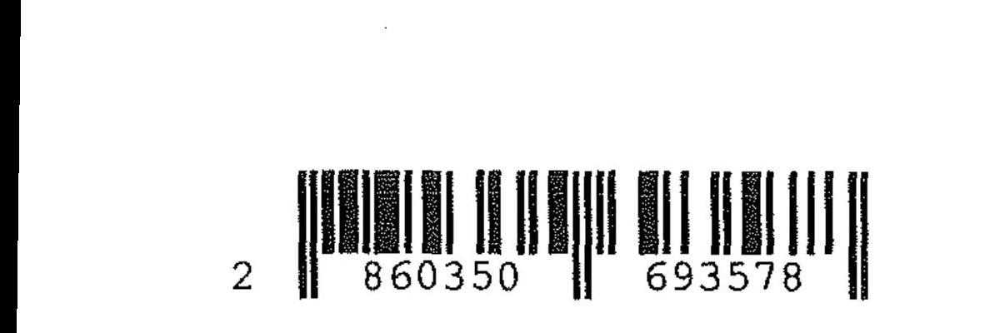

In [24]:
rotate_img

In [25]:
rotate_img.show() 

In [28]:
# image = cv.imread(str(img_path))

# img = decode(image)
# cv.imshow("Image", img)
# cv.waitKey(0)
# cv.destroyAllWindows()

[]


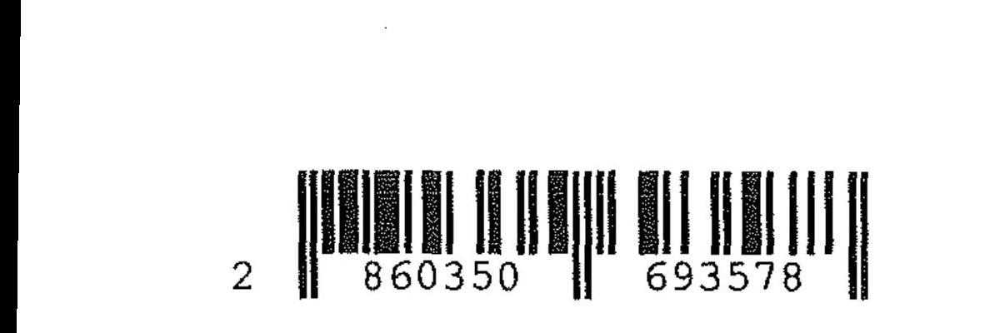

In [29]:
decode(rotate_img)

### Исследование влияния предобработки на качество определения штрих-кода

Вывод: Добавление гауссовского блюра